# 모듈 로드

In [1]:
import numpy as np
import pandas as pd
import warnings
import gc
from tqdm import tqdm_notebook as tqdm
import lightgbm as lgb
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime
from sklearn.metrics import roc_auc_score
warnings.filterwarnings("ignore")
gc.enable()

In [2]:
pd.set_option('max_rows', 500)
pd.set_option('max_colwidth', 500)
pd.set_option('max_columns', 500)

# 데이터 로드

## 훈련데이터

In [31]:
train_raw = pd.read_csv('./data/train.csv')
test_raw = pd.read_csv('./data/test.csv')
train_raw.shape, test_raw.shape

((200000, 202), (200000, 201))

In [30]:
del train, test, clf, data
gc.collect()

13936

In [32]:
train = train_raw.copy()
test = test_raw.copy()

In [33]:
col_list = train.columns[2:]

In [34]:
train_0 = train[train.target == 0]
train_1 = train[train.target == 1]

In [35]:
pb_idx = np.load('./data_temp/public_LB.npy')
pv_idx = np.load('./data_temp/private_LB.npy')

In [36]:
test_pb = test.iloc[pb_idx].sort_index().copy()
test_pv = test.iloc[pv_idx].sort_index().copy()

test_real = test_pb.append(test_pv)

In [37]:
data = train.append(test_real)[['ID_code', 'target'] + col_list.tolist()]

## 삐구 데이터 로드

In [38]:
oof = pd.read_csv('./data_temp/new_bbiggu.csv')

In [20]:
unique_df = data[['ID_code', 'target']]
con_df = data[['ID_code', 'target']]

# 분석

## 유니크

In [21]:
for col in tqdm(col_list):
    unique_df[col] = data[col].map(((data[col].value_counts() == 1) * 1).to_dict())
    con_df[col] = data[col].map((~(data[col].value_counts() == 1) * 1).to_dict())

In [22]:
for col in tqdm(col_list):
    unique_df[col] = data[col] * unique_df[col]
    con_df[col] = data[col] * con_df[col]

## 삐꾸 로드

In [12]:
bbiggu_0_id_code = oof[(oof.target == 0) & (oof.pred > 0.1)].ID_code
bbiggu_1_id_code = oof[(oof.target == 1) & (oof.pred < 0.1)].ID_code
normal_0_id_code = oof[(oof.target == 0) & (oof.pred < 0.1)].ID_code
normal_1_id_code = oof[(oof.target == 1) & (oof.pred > 0.1)].ID_code

In [30]:
bbiggu_1_unique = unique_df[unique_df.ID_code.isin(bbiggu_1_id_code)]
normal_0_unique = unique_df[unique_df.ID_code.isin(normal_0_id_code)]
normal_1_unique = unique_df[unique_df.ID_code.isin(normal_1_id_code)]
bbiggu_0_unique = unique_df[unique_df.ID_code.isin(bbiggu_0_id_code)]

In [79]:
normal_1_unique.head(100)

,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,var_11,var_12,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,var_21,var_22,var_23,var_24,var_25,var_26,var_27,var_28,var_29,var_30,var_31,var_32,var_33,var_34,var_35,var_36,var_37,var_38,var_39,var_40,var_41,var_42,var_43,var_44,var_45,var_46,var_47,var_48,var_49,var_50,var_51,var_52,var_53,var_54,var_55,var_56,var_57,var_58,var_59,var_60,var_61,var_62,var_63,var_64,var_65,var_66,var_67,var_68,var_69,var_70,var_71,var_72,var_73,var_74,var_75,var_76,var_77,var_78,var_79,var_80,var_81,var_82,var_83,var_84,var_85,var_86,var_87,var_88,var_89,var_90,var_91,var_92,var_93,var_94,var_95,var_96,var_97,var_98,var_99,var_100,var_101,var_102,var_103,var_104,var_105,var_106,var_107,var_108,var_109,var_110,var_111,var_112,var_113,var_114,var_115,var_116,var_117,var_118,var_119,var_120,var_121,var_122,var_123,var_124,var_125,var_126,var_127,var_128,var_129,var_130,var_131,var_132,var_133,var_134,var_135,var_136,var_137,var_138,var_139,var_140,var_141,var_142,var_143,var_144,var_145,var_146,var_147,var_148,var_149,var_150,var_151,var_152,var_153,var_154,var_155,var_156,var_157,var_158,var_159,var_160,var_161,var_162,var_163,var_164,var_165,var_166,var_167,var_168,var_169,var_170,var_171,var_172,var_173,var_174,var_175,var_176,var_177,var_178,var_179,var_180,var_181,var_182,var_183,var_184,var_185,var_186,var_187,var_188,var_189,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
13,train_13,1.0,16.3699,0.0000,0.0000,0.0000,0.0000,5.9004,0.000,0.0000,0.0000,0.0000,0.0000,-11.3409,0.0,0.0000,0.0000,0.0000,0.0000,-0.0000,0.0000,9.1793,0.0000,0.0000,0.0000,0.0000,0.0000,0.0,-0.0000,-0.0000,0.0000,0.0000,-0.0000,0.0000,-0.0000,0.0000,0.000,0.0000,-0.5110,0.0000,0.0000,0.0000,-0.0000,20.3226,0.0000,0.0,0.0000,0.0000,0.0000,-16.4423,0.0000,10.3608,0.0000,28.1402,-0.0000,0.000,0.0000,12.1580,0.0000,0.0000,0.0000,0.0000,0.0000,-21.2631,0.0000,-0.0000,0.0000,0.0000,0.0,0.0000,0.0,-0.0000,0.0000,0.0,-0.0000,2.0563,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,-4.2354,0.0000,-0.0000,-0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,5.1511,0.0,0.0000,0.0,0.0000,0.0,26.9915,0.0000,0.0000,-0.0000,0.0000,0.0000,23.1168,0.0,0.0000,0.0000,0.0000,0.0000,0.0,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,-0.0000,0.0000,13.8302,-0.0000,-0.0000,0.0000,0.0000,-0.0000,0.0000,0.0000,0.0,0.0000,0.0000,-0.0000,0.0000,0.0000,0.0000,0.0000,0.0,-0.0000,0.0000,0.0000,6.3593,-1.5168,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,-6.1274,0.0000,1.5096,0.0000,0.0000,0.0000,0.0000,0.0000,-0.0000,0.0000,-0.0000,18.1658,0.0000,0.0000,0.0,0.0000,0.0000,-0.0000,0.0000,0.0,-0.0000,7.5711,0.0,0.0000,-0.0000,0.0000,-0.0000,0.0000,0.0000,-12.4963,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,-0.0000,0.0000,-0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,-0.0000,0.0000,0.0000,0.0000,-10.8529
29,train_29,1.0,0.0000,-0.0000,0.0000,3.1193,6.6483,-0.0000,0.000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0,0.0000,0.0000,0.0000,0.0000,5.2004,1.6610,0.0000,3.1983,0.0000,0.0000,0.0000,0.0000,0.0,-0.0000,-0.0000,0.0000,0.0000,-16.2435,0.0000,-3.2509,0.0000,0.000,0.0000,0.0000,0.0000,0.0000,-0.0000,-0.0000,0.0000,0.0000,0.0,0.0000,14.5023,0.0000,-0.0000,8.1215,0.0000,0.0000,0.0000,-0.0000,0.000,8.2102,0.0000,0.0000,0.0000,-0.0000,0.0000,0.0000,-7.0555,-0.0000,0.0000,0.0000,0.0000,0.0,4.7981,0.0,-0.0000,0.0000,0.0,-0.0000,29.0933,23.0940,0.0000,7.0666,0.0000,0.0000,0.0000,-9.1243,0.0000,11.2055,0.0000,-0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,-5.2911,0.0,0.0000,0.0,0.0000,-0.0,0.0000,0.0000,0.0000,-0.0000,-18.6567,0.0000,0.0000,0.0,0.0000,0.0000,12.4790,0.0000,0.0,11.8464,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,21.8669,0.0000,0.0000,0.0000,0.0000,-0.0000,-0.0000,0.0000,0.0,0.0000,5.5083,-0.0000,0.0000,0.0000,0.0000,0.0000,0.0,-0.0000,-16.8994,0.0000,17.4941,-0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,-0.0000,0.0000,-9.7420,0.0000,-0.0000,17.5355,0.000

In [78]:
normal_0_unique.head(100)

,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,var_11,var_12,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,var_21,var_22,var_23,var_24,var_25,var_26,var_27,var_28,var_29,var_30,var_31,var_32,var_33,var_34,var_35,var_36,var_37,var_38,var_39,var_40,var_41,var_42,var_43,var_44,var_45,var_46,var_47,var_48,var_49,var_50,var_51,var_52,var_53,var_54,var_55,var_56,var_57,var_58,var_59,var_60,var_61,var_62,var_63,var_64,var_65,var_66,var_67,var_68,var_69,var_70,var_71,var_72,var_73,var_74,var_75,var_76,var_77,var_78,var_79,var_80,var_81,var_82,var_83,var_84,var_85,var_86,var_87,var_88,var_89,var_90,var_91,var_92,var_93,var_94,var_95,var_96,var_97,var_98,var_99,var_100,var_101,var_102,var_103,var_104,var_105,var_106,var_107,var_108,var_109,var_110,var_111,var_112,var_113,var_114,var_115,var_116,var_117,var_118,var_119,var_120,var_121,var_122,var_123,var_124,var_125,var_126,var_127,var_128,var_129,var_130,var_131,var_132,var_133,var_134,var_135,var_136,var_137,var_138,var_139,var_140,var_141,var_142,var_143,var_144,var_145,var_146,var_147,var_148,var_149,var_150,var_151,var_152,var_153,var_154,var_155,var_156,var_157,var_158,var_159,var_160,var_161,var_162,var_163,var_164,var_165,var_166,var_167,var_168,var_169,var_170,var_171,var_172,var_173,var_174,var_175,var_176,var_177,var_178,var_179,var_180,var_181,var_182,var_183,var_184,var_185,var_186,var_187,var_188,var_189,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
0,train_0,0.0,0.0000,-0.0000,0.0000,0.0000,0.0000,-0.0000,0.0,0.0000,-0.0000,0.0000,0.0000,0.0000,0.0,0.5745,0.0000,0.0,5.7487,-0.0000,4.2840,30.7133,0.0000,0.0000,0.0000,0.0,0.0000,0.0,-0.0000,-0.0000,0.0,0.0000,-0.3085,0.0000,-0.0000,0.0000,0.0,0.0000,0.0000,0.0000,4.6667,3.8743,-0.0000,0.0000,0.0000,0.0,0.0000,-7.0170,5.9226,-14.2136,0.0000,0.0000,0.0000,29.0460,-0.0000,0.000,-0.7474,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,4.9590,0.0000,-0.0000,0.0000,9.5319,0.0000,22.4321,0.0,-0.0000,0.0000,0.0000,0.0000,0.0000,43.1127,0.0000,-2.3440,0.0000,0.0000,0.0000,0.0000,0.0000,1.3675,0.0000,-0.0000,0.0000,0.0000,0.0000,0.0000,-0.0000,-21.4494,0.0000,0.0000,0.0000,0.0000,0.0,0.0000,16.2572,0.0,-0.0000,9.4763,0.0000,0.0000,0.0,0.0000,6.0454,0.0000,0.0000,0.0,0.0000,0.0000,0.0000,0.0000,-0.4851,0.0,0.0000,0.0000,15.5752,-0.0000,7.2739,0.0000,0.0000,0.0000,0.7754,0.0000,0.0000,0.0,-0.0000,-0.0000,0.0000,0.0000,0.0,0.0000,0.0,0.0000,0.0000,0.0000,31.4045,0.0000,15.6599,0.0000,-0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,-0.0000,0.0,17.9244,0.0000,0.0000,0.0000,0.0000,0.0000,1.6573,0.0000,-0.0000,0.0000,0.0000,0.0000,0.0,0.0000,0.0000,6.6760,0.0000,0.0,-0.0000,0.0000,0.0,-0.0000,-0.0000,0.0000,0.0000,0.0000,0.0000,-0.0000,0.0000,-0.0000,0.0000,-0.0000,0.0000,0.0000,0.0000,0.0000,5.8764,0.0000,-0.0000,0.0000,0.0,0.0000,0.0000,0.0000,0.0000,0.0000,-0.0000,0.0000,0.0,0.0000,-0.0000
2,train_2,0.0,0.0000,-2.7457,0.0000,0.0000,0.0000,-0.0000,0.0,0.0000,-4.9193,0.0000,-0.0000,-11.2648,0.0,0.0000,0.0000,0.0,0.0000,-1.7395,0.0000,0.0000,0.0000,0.0000,0.0000,0.0,5.6777,0.0,-0.0000,-0.0000,0.0,0.0000,-0.0000,0.0000,-0.0000,0.0000,0.0,0.0000,0.0000,0.0000,0.0000,0.0000,-0.0000,0.0000,0.0000,0.0,4.1006,-0.0000,0.0000,-5.7864,0.0000,0.0000,0.0000,0.0000,0.0000,0.000,9.3124,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,-10.3734,0.0000,0.0000,0.0000,-0.0000,0.0000,9.8565,0.0,-0.0000,2.3612,0.0000,0.0000,12.1719,19.7312,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,-0.0000,0.0000,0.0000,0.0000,-22.4038,0.0000,0.0000,0.0000,0.0000,0.0,0.0000,17.0360,0.0,-0.0000,-0.0000,0.0000,0.0000,0.0,0.0000,0.0000,0.0000,8.6273,0.0,0.0000,0.0000,0.0000,0.0000,0.0000,0.0,0.0000,0.0000,0.0000,-0.0000,0.0000,21.1613,8.9573,0.0000,-2.1746,0.0000,0.0000,0.0,-0.0000,-0.0000,17.1092,0.0000,0.0,0.0000,0.0,0.0000,-11.7218,0.0000,0.0000,0.0000,0.0000,0.0000,-0.0000,0.0000,7.4844,0.0000,0.0000,0.0000,0.0000,0.0,-0.0000,0.0000,0.0000,0.0000,0.0000,-5.1747,0.0000,0.0000,-0.0000,

In [62]:
def a(data):
    return "-".join([col.split('_')[-1] for col in data.loc[col_list][data.loc[col_list] != 0].index.tolist()])

In [66]:
t = bbiggu_1_unique.apply(a, axis=1)

In [75]:
for v in t.values.tolist():
    print(v)

0-5-10-18-21-45-48-51-53-54-60-65-67-70-74-75-77-82-97-100-109-113-117-118-120-134-136-147-151-160-164-168-172-174-177-179-187
5-10-18-20-21-30-40-47-48-49-52-58-65-67-75-83-90-94-96-97-138-141-149-154-157-160-164-170-171-172-173-176-182-185-190-195-199
7-17-22-24-26-32-45-49-51-60-61-70-83-84-92-97-102-109-110-123-127-130-135-136-137-138-143-146-147-149-165-167-171-172-173-174-182-190
14-19-20-21-22-26-30-32-41-45-51-60-67-69-72-74-82-86-97-100-101-102-117-118-119-122-127-136-137-145-149-159-160-168-171-173-185-187-188-193
7-10-21-30-31-32-39-44-45-47-54-58-61-69-70-74-76-100-109-113-120-138-152-158-160-163-170-176-178-182-186-187-190-193-199
5-7-10-17-18-20-26-36-44-47-49-51-52-61-63-74-82-86-90-101-107-109-110-117-118-120-135-138-147-159-160-163-164-167-170-172-176-193
17-19-20-36-41-47-48-51-61-65-72-73-75-82-90-97-100-104-107-135-155-163-170-172-182-191-193
5-11-18-20-21-22-30-45-48-49-53-54-55-61-67-70-83-84-86-87-96-109-115-117-118-123-134-137-139-154-160-163-165-171-182-184-185

10-21-24-30-39-46-47-51-56-60-70-73-75-82-90-100-106-117-118-136-137-138-141-145-160-167-172-180-187
5-7-8-11-18-19-26-30-36-40-51-54-61-70-73-74-80-83-87-96-97-102-109-110-113-118-123-128-135-136-137-143-151-153-157-158-174-176-182-187-192-196-199
5-10-11-13-17-18-21-26-30-31-38-44-47-49-56-58-61-63-70-72-73-76-82-92-100-102-106-115-116-121-122-129-137-139-144-154-178-182-184-185-187-190-193-194
2-4-5-11-19-22-35-40-44-45-51-54-56-67-70-76-80-82-101-107-110-117-120-134-141-143-147-157-158-160-163-165-171-178-180-187-190-198-199
8-10-17-19-24-26-30-33-45-48-51-61-63-65-70-74-80-84-96-100-102-110-113-117-120-126-128-129-134-136-138-139-145-147-160-167-173-184-187-194
5-13-21-30-40-45-47-48-64-69-70-73-74-76-82-87-90-92-96-97-100-101-119-134-136-139-140-149-152-155-158-160-163-165-167-168-172-174-177-178-181-184-187-198
5-10-14-17-21-30-33-38-39-45-47-48-54-58-61-63-65-67-72-74-80-83-84-85-87-90-96-100-107-110-117-122-123-135-136-138-139-142-147-152-158-160-163-171-174-175
3-10-17-21-24-

5-10-14-18-21-29-30-40-45-47-48-54-61-69-70-72-74-75-80-85-87-90-97-120-123-136-137-139-141-154-157-160-164-167-173-180-185-196-198
3-5-17-40-41-44-45-47-48-49-54-56-63-67-70-89-107-110-118-120-123-137-145-146-147-149-151-158-159-160-163-170-171-182-190-193-196
5-9-19-21-22-27-32-38-45-47-51-55-58-61-73-74-75-76-86-88-97-100-102-118-123-129-134-136-137-138-139-141-143-147-156-157-163-164-171-173-174-177-187-190-199
5-17-18-20-21-30-35-41-47-51-52-55-56-61-72-74-75-76-88-102-107-117-119-134-135-136-152-159-170-175-176-178-186-187-188-190
20-21-24-26-36-38-39-41-47-48-54-61-65-67-73-83-84-87-90-96-97-100-102-115-126-134-138-139-147-154-155-159-160-165-172-176-178-180-182-184-187-188-198
11-17-19-30-39-40-45-48-49-55-61-64-76-82-88-90-97-100-102-118-123-129-134-135-136-139-141-145-149-155-157-158-159-160-165-167-171-172-174-178-182-184-187-188-191-197
5-17-21-24-27-35-39-45-48-50-52-61-66-76-85-88-90-97-98-104-113-117-118-123-140-142-151-155-157-158-160-167-171-174-176-178-191-199
1-17-18

0-7-16-19-20-26-33-48-49-51-61-77-81-83-85-87-89-97-100-118-119-122-129-134-136-137-145-147-155-158-159-160-163-170-171-184-187-188-199
7-11-13-17-31-36-40-45-47-60-61-65-70-76-111-120-122-134-136-147-151-157-158-167-173-174-175-184-187-190
19-24-37-41-44-51-61-88-89-90-97-100-101-107-113-117-122-135-140-141-142-143-146-147-149-158-160-164-172-173-178-179-194-199
13-18-19-30-38-41-48-52-56-60-61-73-74-78-80-90-96-100-102-117-118-122-139-141-158-159-160-163-167-170-174-178-182-185-188-196-199
2-10-14-17-18-20-24-32-52-54-60-69-74-77-78-80-81-82-83-87-97-102-110-111-119-122-124-147-160-171-173-180-184-186-187
5-11-17-18-20-30-39-48-49-58-76-83-86-90-92-97-100-101-110-117-122-123-128-136-140-158-165-176-178-187
2-17-20-26-30-33-40-45-48-61-74-75-77-80-83-84-96-100-113-118-120-123-124-128-136-147-159-173-174-176-180-184-191
5-7-17-30-31-40-48-51-56-60-61-63-64-72-82-83-84-86-97-100-102-117-118-120-122-127-135-137-147-158-160-171-174-182-184-187-190-199
5-11-18-32-33-35-38-47-48-49-61-74-76

13-17-19-20-41-45-47-55-61-76-83-84-90-96-100-107-117-119-120-121-124-127-136-137-141-142-143-147-149-160-163-167-172-175-187-188-199
1-3-16-17-18-19-33-38-39-44-45-47-51-55-73-75-76-82-86-88-90-97-99-100-109-124-135-136-138-139-142-145-158-171-172-184-187-191
0-5-8-18-24-29-40-45-48-49-56-58-67-70-75-76-86-90-97-117-122-143-154-159-160-164-167-171-173-180-184-187-190-194-199
5-11-13-18-20-30-36-40-46-49-51-56-58-61-67-70-76-84-94-96-100-102-117-118-134-136-139-145-158-165-172-180-187
0-12-30-40-44-45-46-48-49-51-54-73-82-84-97-100-102-107-117-118-128-136-157-158-163-164-173-182-190
10-19-30-36-40-41-47-50-51-52-54-56-75-76-77-79-82-84-86-92-96-97-118-129-134-136-137-139-143-145-149-152-154-158-163-168-172-182-187-188-196-198-199
2-5-17-20-47-48-49-51-54-56-58-61-73-74-87-96-101-110-116-117-118-135-139-141-149-151-154-155-164-167-172-180-182-183-185-188-195
1-4-13-17-18-20-32-37-39-44-48-61-67-70-72-74-76-86-88-90-113-117-118-119-122-134-135-138-142-155-163-167-170-172-187-198
0-5-13-1

7-8-16-19-26-30-45-47-61-74-75-80-82-92-101-119-120-122-123-136-145-147-157-160-167-170-171-172-174-178-182-186-193-199
5-21-26-30-38-39-44-45-46-49-51-54-70-74-80-84-86-102-110-123-128-134-135-136-137-157-160-168-170-176-178-179-180-183-191
13-18-30-31-35-41-45-48-49-51-54-65-70-74-87-90-100-101-102-110-120-123-136-137-143-147-155-157-160-164-165-172-173-182-185-187
2-5-13-16-26-30-31-51-52-55-61-73-79-80-82-83-84-86-96-102-109-117-118-128-134-136-143-151-158-163-167-177-184-196-197-199
0-35-37-40-45-54-65-73-74-81-84-90-96-107-117-120-122-127-135-136-137-138-139-149-165-167-171-182-183-184-190-193-194-199
2-11-20-24-30-31-53-58-60-73-74-77-82-83-85-89-90-107-117-118-127-129-136-146-147-151-173-180-184-199
13-14-16-17-19-20-30-33-38-39-41-45-65-70-73-74-76-86-87-96-97-100-104-107-110-116-119-123-128-136-138-139-156-158-160-165-171-182-185-187-190-196
1-19-24-29-41-44-45-47-49-69-70-72-73-74-75-76-82-83-89-96-97-100-101-102-113-117-120-123-137-140-142-152-170-171-178-182-187-199
11-13-

7-17-21-31-41-44-45-47-52-55-61-72-73-75-76-80-82-86-92-94-96-97-100-117-119-120-122-129-134-135-136-140-141-151-154-158-159-160-163-173-187-193-196
1-20-21-38-45-48-49-51-59-60-70-74-83-87-94-100-102-107-110-113-117-120-121-123-139-149-157-158-160-163-167-171-172-174-184-185-187-196-199
5-18-19-21-24-41-47-48-49-60-69-70-73-74-76-84-85-90-96-97-113-117-123-129-135-136-140-142-146-147-157-158-159-168-170-174-175-182-185-187-188-199
11-18-37-40-44-45-48-52-54-60-67-86-90-97-100-102-113-117-122-135-136-140-141-147-155-158-159-160-164-168-170-172-173-176-178-181-183-185-187-191
5-10-18-30-45-46-48-50-52-61-67-70-74-76-90-96-99-102-109-117-118-119-135-140-145-147-151-155-172-173-174-183-187-198
0-2-22-35-39-41-45-47-51-55-61-67-70-72-74-76-82-84-90-96-97-100-120-122-129-141-142-149-155-160-162-165-174-175-178-185-187-198-199
8-48-52-70-74-76-82-84-87-97-102-117-119-120-124-135-137-141-142-149-151-154-158-164-173-174-180-182-183-184-185-186-187-188-195
3-10-11-13-26-30-45-47-61-62-69-74-80-

0-5-19-21-22-40-45-58-60-61-63-67-73-82-85-86-90-92-96-100-101-102-117-118-143-160-180-193
5-10-17-24-36-45-46-47-54-55-58-61-63-67-73-75-83-86-96-100-101-102-117-120-123-135-137-141-155-158-159-167-174-178-180-182-183-185-187-188-196-198-199
14-18-30-44-45-47-49-51-54-69-74-80-83-97-100-101-107-117-119-120-136-137-139-143-145-147-149-160-164-165-168-173-180-182-186-194
13-24-29-30-31-34-35-39-40-45-47-49-56-61-69-70-73-74-76-96-97-102-107-114-117-138-141-145-147-149-158-160-167-168-172-176-178-194-199
9-10-19-24-29-30-35-40-47-52-58-60-61-75-82-86-93-96-102-109-117-136-137-147-158-163-173-176-177-178-182-187-196
5-7-10-11-13-20-22-39-52-54-55-61-67-72-82-107-117-118-120-122-123-129-137-139-145-158-159-160-164-171-173-179-184-187-199
8-17-33-60-70-74-75-86-92-104-109-113-117-122-123-134-136-141-143-149-157-159-160-173-176-178-179-187-198-199
10-17-20-36-38-40-41-47-51-52-54-55-61-74-81-82-83-97-100-104-113-117-120-127-129-137-145-149-163-171-177-178-182-183-187-196
5-18-19-22-30-33-38-

1-11-13-19-21-35-46-61-69-70-73-74-80-83-87-90-96-97-100-113-117-123-135-137-141-142-151-155-159-167-176-178-183-187-188-193-199
7-11-17-21-35-45-51-73-89-109-115-120-122-123-128-134-135-145-158-159-160-172-173-176-178-182-185-196-198-199
1-11-14-19-26-30-31-47-48-49-54-56-61-70-73-100-101-102-117-120-123-135-142-149-158-172-176-178-183-185-191-194-199
17-18-21-30-38-40-54-55-74-82-92-96-97-102-117-135-136-137-139-140-141-142-149-151-157-158-165-168-176-178-182-187-190-198-199
5-10-13-19-20-30-35-36-47-48-49-70-73-75-80-82-83-89-90-96-100-101-107-120-128-138-154-155-160
5-10-13-17-18-19-29-40-44-46-48-49-56-58-60-63-65-70-72-74-82-86-87-90-92-96-99-100-102-107-119-120-122-128-135-143-149-155-157-158-167-170-174-178-182-184-187-190-196-199
5-13-15-19-21-26-30-45-47-48-49-52-54-55-61-72-82-90-92-96-100-102-118-120-122-129-135-143-164-167-171-177-178-185-186-187
5-17-20-30-40-47-48-55-63-74-76-82-84-87-97-107-113-114-115-117-119-120-124-128-129-136-137-141-149-158-172-173-178-183-190-199


5-11-17-18-19-30-44-45-47-48-69-86-87-90-94-100-135-141-147-160-163-165-168-174-176-178-182-194
11-16-17-18-19-21-26-35-45-48-51-54-58-61-73-77-83-85-86-96-97-109-115-117-122-138-141-147-158-160-165-167-171-178-182-184-186-188
1-5-8-11-18-19-26-41-47-48-51-65-67-70-73-80-85-87-90-94-97-100-101-102-107-118-119-120-127-137-139-140-151-152-154-163-164-171-172-174-176-183-184-187-199
10-17-18-27-30-33-35-40-41-47-49-54-55-69-70-74-85-86-97-100-102-118-119-136-143-149-160-175-178-180-183-186-194-198
1-5-11-19-33-40-45-47-60-61-70-73-74-83-90-92-96-102-118-123-129-137-140-149-158-164-180-182-185-190-196
7-21-42-45-61-67-70-74-79-86-96-113-118-119-122-129-136-137-154-160-163-164-165-174-180-184-185-188
1-5-16-17-26-32-40-41-45-51-61-67-70-73-75-77-80-82-92-97-100-102-122-124-137-138-139-141-149-151-155-160-168-172-176-177-178-184-188-194-196-199
19-21-22-24-45-47-48-51-58-62-74-75-77-86-92-97-104-109-117-120-123-124-134-135-136-137-142-147-149-154-158-160-167-174-182-184-187-190-193-196
19-20

13-20-21-44-45-47-49-51-58-61-70-73-74-80-81-97-102-107-110-115-120-122-136-137-138-158-160-165-174-176-180-182-184-187-199
8-17-18-21-22-40-45-47-49-54-58-67-69-73-81-82-89-96-97-99-100-102-113-118-120-129-134-139-141-149-152-160-174-181-190-196-199
1-5-10-11-18-30-45-48-54-56-58-60-61-67-74-80-82-92-96-97-100-102-104-106-110-117-120-123-127-134-135-138-139-145-146-154-157-160-176-182-193-196-199
11-16-17-35-40-41-44-45-48-49-52-54-60-67-70-72-73-82-84-85-87-92-100-123-124-138-139-141-145-149-152-155-158-167-176-184-187-199
11-13-20-30-45-47-48-49-51-54-61-70-74-84-97-100-107-109-117-118-135-139-141-142-143-149-154-160-163-168-183-193-194
10-20-29-30-36-38-39-41-45-49-51-61-67-70-75-77-86-87-101-102-117-120-134-136-137-141-142-146-147-160-167-175-178-182-185
5-11-17-19-20-21-24-26-30-37-45-48-49-52-56-63-67-75-80-87-90-96-97-100-110-119-134-136-139-140-143-147-151-160-170-180-182-187-191
4-13-19-21-33-40-52-55-58-60-75-82-86-87-88-89-92-96-97-102-112-120-122-137-141-147-151-167-175-18

0-1-5-24-39-40-47-48-49-51-56-69-72-74-80-82-92-96-102-113-115-117-119-122-129-135-136-141-149-150-151-155-158-170-176-199
18-32-35-36-40-44-47-48-51-54-55-56-63-67-74-76-77-80-86-90-97-106-117-119-120-129-134-135-147-154-155-158-164-167-174-178-199
8-10-18-19-24-26-38-45-47-48-49-60-70-73-76-83-85-97-107-114-117-120-128-134-135-136-138-155-163-164-176-180-196
19-21-32-40-47-48-49-51-55-61-67-72-73-74-75-80-82-90-93-94-102-107-117-118-120-135-136-137-141-157-164-167-171-176-178-182-183-184-187-191
1-5-11-17-20-21-29-30-31-41-44-45-47-48-49-51-61-63-67-69-70-80-84-90-102-110-120-123-132-136-139-145-151-164-174-176-185-187-193-197
7-11-17-21-30-38-39-41-45-52-56-58-60-63-74-76-78-86-87-92-96-107-117-118-123-129-136-137-153-157-158-164-165-170-171-172-174-175-182-184-187-193
10-11-13-17-19-21-47-61-65-73-74-76-80-82-84-86-87-89-96-109-117-120-121-134-136-137-141-149-154-155-156-160-163-164-172-174-176-177-182-187-199
5-17-19-20-26-48-49-51-52-74-75-76-77-80-85-94-96-97-100-101-107-110-118

18-19-36-38-40-41-47-48-54-61-70-72-73-74-77-87-90-97-101-113-117-118-124-129-134-135-137-139-145-149-159-160-165-172-176-178-184
10-18-30-38-39-40-44-45-48-54-58-60-61-62-67-74-76-80-86-90-92-102-107-113-115-118-119-141-147-157-158-160-164-167-170-176-180-184
1-2-16-29-30-40-41-47-48-82-86-89-92-96-97-100-107-118-129-136-151-164-175-176-178-182-191-199
1-4-7-11-18-19-28-30-44-45-56-61-77-84-86-92-96-107-117-118-119-134-136-137-139-141-142-149-160-163-172-179-183-185-187
0-21-30-39-45-47-48-52-54-58-62-67-73-74-82-97-100-113-118-127-137-142-149-158-163-167-170-175-178-182-184-185-187-192-199
1-11-18-19-20-36-39-45-48-49-52-56-70-73-76-80-84-87-96-100-110-117-134-137-147-149-167-172-174-184-187-192-196-198-199
1-5-18-26-35-36-40-45-47-52-65-70-75-82-83-94-96-100-109-110-112-118-120-136-137-142-143-147-150-155-157-164-165-167-172-174-176-178-185-187-199
2-10-24-29-38-44-47-52-56-58-60-65-73-76-80-84-87-99-102-106-117-119-123-135-136-137-141-143-149-154-155-158-164-173-174-182-185-196
5-1

10-11-17-19-24-30-35-38-40-41-45-48-49-70-73-76-80-83-86-87-89-92-102-113-117-118-137-139-141-142-147-165-171-176-182-184
5-17-19-21-30-35-40-41-47-51-54-55-63-72-77-82-83-84-89-90-97-101-102-109-117-119-134-139-145-149-153-157-159-160-163-168-172-178-188-199
1-5-41-45-47-48-51-54-56-69-74-76-77-83-87-90-96-97-102-117-128-135-136-137-147-149-155-160-173-186-187-196-199
13-16-20-38-40-44-45-48-52-54-55-58-61-65-67-70-74-84-90-113-115-118-122-134-149-151-159-170-172-176-180-186-187-190-193-199
5-10-38-40-45-49-57-61-74-80-82-83-85-90-97-99-100-102-105-107-116-117-118-120-121-124-137-141-142-147-154-155-157-162-163-165-186-194
4-5-10-11-13-17-21-30-47-48-49-55-58-60-66-70-74-90-97-115-120-122-124-138-139-142-143-147-152-159-165-168-176-182-187-191-196-199
0-5-8-13-19-20-33-36-38-47-48-67-70-74-83-87-90-100-107-117-124-128-136-139-147-160-167-178-182-184-192
5-10-18-19-21-30-38-45-48-52-55-60-61-72-74-78-85-86-90-97-100-115-117-134-142-147-149-152-155-158-163-174-176-184-187-193-196
5-9-10

0-10-13-14-19-22-45-48-52-54-61-69-72-73-74-75-82-83-85-92-96-102-107-118-119-120-135-136-138-140-141-145-149-157-158-169-173-176-178-180-188-191-193
8-14-17-18-19-21-32-33-44-45-51-61-67-84-88-90-96-102-106-107-113-115-118-120-124-134-137-139-142-147-149-155-158-160-163-171-172-176-178-182-184-187-190-191-193
1-5-18-19-20-45-47-48-54-61-70-73-74-75-82-87-104-107-117-118-120-122-134-140-149-155-182-183-184-187-190
3-5-16-17-30-32-34-45-49-51-54-61-64-67-69-76-87-90-96-97-100-106-110-117-118-136-137-138-139-142-149-158-165-172-173-176-182-187-193
3-11-18-30-36-39-40-45-47-54-56-61-62-74-75-76-82-83-84-90-96-100-107-115-120-122-127-128-136-139-145-155-160-163-170-171-180-184-185-188-199
1-10-11-13-19-40-45-47-48-49-55-61-67-70-76-84-85-90-99-107-109-112-115-118-120-122-134-135-136-137-139-140-149-155-164-171-184-188-199
17-18-25-29-32-33-45-46-48-49-51-55-70-74-75-76-80-85-87-90-96-100-107-117-118-120-123-129-135-137-141-146-160-164-167-170-172-176-185
5-11-21-33-39-44-47-49-51-52-54-67-

1-16-18-41-45-54-58-61-67-70-73-74-76-82-86-87-89-97-102-110-113-117-123-136-139-147-149-150-154-155-160-170-180-182-184
0-2-3-7-17-19-20-24-35-39-45-48-51-52-60-70-72-73-74-76-80-83-84-86-97-102-111-118-120-136-137-139-141-146-164-171-178-184-194-196
5-18-19-24-33-36-39-40-41-48-51-54-55-67-74-82-84-87-90-97-100-102-106-109-113-117-118-119-123-136-141-147-151-157-159-167-171-174-179-185-187-194
10-11-18-19-20-21-23-30-40-41-44-47-48-51-58-61-63-73-74-75-81-92-94-97-107-110-121-129-138-168-171-174-178-188-199
0-4-5-21-33-35-38-44-45-46-52-55-58-60-67-70-83-86-90-94-96-97-102-107-110-118-123-127-135-136-137-138-139-145-149-155-158-159-168-174-178-182-183-185-186-199
1-5-10-17-18-20-39-45-46-48-51-54-55-58-70-78-87-89-90-96-105-117-129-136-137-141-142-147-152-160-164-167-168-171-172-174-178-179-180-182-183-187-194
17-21-36-47-51-54-58-63-67-74-77-80-82-89-92-97-101-117-118-127-128-134-139-150-165-168-172-173-174-178-182-187-188
5-8-13-17-18-19-30-45-54-58-61-67-75-76-86-96-100-107-117-12

0-2-10-20-22-24-30-35-40-44-45-47-51-52-58-61-70-74-77-87-99-102-109-118-120-122-128-130-141-147-158-159-160-163-165-167-182-183-184-187-190-193-198
1-20-26-30-35-40-45-47-55-58-61-70-73-81-82-83-84-85-107-115-122-123-129-136-137-145-147-149-152-158-164-178-184-187-188-194-199
13-18-20-26-27-35-48-52-54-55-58-61-70-72-73-74-83-87-89-90-118-120-122-124-136-140-145-158-159-164-165-172-180-183-187-191-199
10-39-41-48-55-70-74-79-82-90-96-97-107-115-117-118-119-120-127-129-137-141-142-147-149-151-152-159-160-171-172-174-180-189-190-191
1-8-11-18-24-36-40-45-60-67-70-74-82-83-84-90-92-96-109-117-120-129-134-136-138-140-146-149-164-172-174-182-188-189
10-17-19-22-40-44-48-58-69-73-76-80-82-87-90-97-102-110-117-120-136-151-158-163-174-178-187-188-190-193-198
1-11-16-17-19-29-36-39-41-44-45-60-67-72-77-82-84-102-107-118-127-134-137-143-163-167-172-176-183-184-198-199
16-19-26-32-40-45-47-54-61-67-72-73-74-76-78-80-90-96-97-99-100-117-120-122-123-134-137-138-139-140-145-147-157-159-164-175-178-

8-11-18-26-36-38-40-45-49-52-54-55-65-67-76-82-84-85-90-97-100-102-107-119-153-163-167-168-178-182-184-187-192-193-196-198
0-5-10-11-17-30-36-41-51-60-65-73-80-82-107-112-117-120-123-128-135-147-155-157-158-163-164-167-172-184-185-193
5-11-18-19-21-22-35-39-47-56-61-63-69-70-72-75-82-87-90-100-107-117-119-129-136-138-141-147-154-158-171-174-176-183-184-187
8-17-19-30-31-36-40-41-44-45-54-56-58-61-65-73-80-82-84-85-86-88-92-104-113-117-118-120-122-136-139-149-158-167-172-176-190-199
7-19-26-45-55-58-69-73-82-84-86-89-90-102-107-117-122-123-128-134-140-141-151-152-155-158-163-171-173-176-178-188-199
5-11-17-26-29-49-55-72-73-83-86-100-112-119-120-138-141-142-146-149-158-160-165-185-191-196
7-8-19-21-36-45-54-58-60-69-74-75-79-80-83-85-90-102-109-117-118-123-135-137-139-141-145-146-147-149-154-165-173-174-176-180-182-184-185-186-199
1-16-17-19-21-44-45-54-58-60-61-67-69-76-80-83-84-87-88-90-96-97-102-110-113-115-116-117-123-124-139-147-149-160-171-174-175-182-199
5-11-19-22-35-41-48-49-58

10-19-21-41-45-51-58-61-65-67-72-86-97-109-112-120-134-135-136-139-141-145-147-149-151-155-172-176-182-184-199
10-13-17-18-19-32-38-41-44-51-55-58-61-67-70-73-74-75-76-81-97-99-106-109-117-120-122-128-135-136-137-138-141-143-146-149-152-154-170-174-180-188-190-196-199
3-7-10-11-13-17-19-20-21-26-33-44-45-48-52-70-74-90-92-94-96-100-106-107-111-118-122-124-139-144-149-154-163-164-172-173-176-183-184-190-199
5-19-40-48-58-67-69-70-73-74-76-77-83-88-90-100-101-102-107-120-122-129-135-139-151-171-177-185-187-196-199
5-8-13-17-20-26-32-37-38-40-51-53-54-56-63-69-76-80-86-87-88-110-113-117-120-122-134-140-141-149-154-167-173-174-175-191-199
5-11-17-20-27-30-36-39-40-41-45-48-60-67-69-74-80-83-92-96-97-101-102-109-117-120-122-123-134-136-138-140-142-146-158-160-165-170-178-183-187-194-199
11-19-30-40-44-55-58-65-80-81-96-97-117-118-120-124-129-134-136-138-139-155-157-158-160-167-173-178-181-184-187-191-198-199
7-11-32-35-45-47-51-54-61-67-74-80-85-86-97-100-102-117-118-123-129-135-137-141-143

KeyboardInterrupt: 

In [77]:
normal_0_unique[:100].apply(a, axis=1).values

array(['13-16-18-19-30-38-39-45-46-47-51-54-61-65-67-74-76-82-90-97-100-105-113-117-119-123-137-139-149-155-164-185',
       '1-8-11-17-24-44-47-54-61-67-70-73-74-90-97-107-120-121-123-129-135-143-154-158-163-172-174-187-188',
       '5-8-10-13-26-30-38-45-47-49-54-67-73-75-83-84-90-96-97-100-104-109-113-115-117-118-120-123-128-136-139-140-147-149-151-157-158-159-163-164-165-167-172-177-183-187-192-193-194',
       '13-20-27-29-31-33-45-47-48-52-60-63-73-74-76-87-89-101-102-104-107-117-118-120-127-134-136-147-154-157-158-159-163-173-180-184-185-187-190',
       '1-7-21-26-40-45-47-49-54-61-65-70-74-77-80-84-90-96-100-102-107-117-120-123-137-139-142-145-147-156-157-160-165-168-170-171-172-177-180-183-190-198',
       '5-11-13-14-18-21-31-35-40-46-47-55-58-67-76-82-86-88-90-102-136-141-158-172-174-178-179-182-183-187-191',
       '13-17-18-21-24-29-33-36-39-45-54-55-61-65-75-80-82-85-92-97-100-107-117-120-135-136-142-151-165-171-172-173-174-199',
       '5-11-14-17-19-20-30-36-40-45-47-4

In [29]:
normal_0_unique.head(100)

,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,var_11,var_12,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,var_21,var_22,var_23,var_24,var_25,var_26,var_27,var_28,var_29,var_30,var_31,var_32,var_33,var_34,var_35,var_36,var_37,var_38,var_39,var_40,var_41,var_42,var_43,var_44,var_45,var_46,var_47,var_48,var_49,var_50,var_51,var_52,var_53,var_54,var_55,var_56,var_57,var_58,var_59,var_60,var_61,var_62,var_63,var_64,var_65,var_66,var_67,var_68,var_69,var_70,var_71,var_72,var_73,var_74,var_75,var_76,var_77,var_78,var_79,var_80,var_81,var_82,var_83,var_84,var_85,var_86,var_87,var_88,var_89,var_90,var_91,var_92,var_93,var_94,var_95,var_96,var_97,var_98,var_99,var_100,var_101,var_102,var_103,var_104,var_105,var_106,var_107,var_108,var_109,var_110,var_111,var_112,var_113,var_114,var_115,var_116,var_117,var_118,var_119,var_120,var_121,var_122,var_123,var_124,var_125,var_126,var_127,var_128,var_129,var_130,var_131,var_132,var_133,var_134,var_135,var_136,var_137,var_138,var_139,var_140,var_141,var_142,var_143,var_144,var_145,var_146,var_147,var_148,var_149,var_150,var_151,var_152,var_153,var_154,var_155,var_156,var_157,var_158,var_159,var_160,var_161,var_162,var_163,var_164,var_165,var_166,var_167,var_168,var_169,var_170,var_171,var_172,var_173,var_174,var_175,var_176,var_177,var_178,var_179,var_180,var_181,var_182,var_183,var_184,var_185,var_186,var_187,var_188,var_189,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
0,train_0,0.0,0.0000,-0.0000,0.0000,0.0000,0.0000,-0.0000,0.0,0.0000,-0.0000,0.0000,0.0000,0.0000,0.0,0.5745,0.0000,0.0,5.7487,-0.0000,4.2840,30.7133,0.0000,0.0000,0.0000,0.0,0.0000,0.0,-0.0000,-0.0000,0.0,0.0000,-0.3085,0.0000,-0.0000,0.0000,0.0,0.0000,0.0000,0.0000,4.6667,3.8743,-0.0000,0.0000,0.0000,0.0,0.0000,-7.0170,5.9226,-14.2136,0.0000,0.0000,0.0000,29.0460,-0.0000,0.000,-0.7474,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,4.9590,0.0000,-0.0000,0.0000,9.5319,0.0000,22.4321,0.0,-0.0000,0.0000,0.0000,0.0000,0.0000,43.1127,0.0000,-2.3440,0.0000,0.0000,0.0000,0.0000,0.0000,1.3675,0.0000,-0.0000,0.0000,0.0000,0.0000,0.0000,-0.0000,-21.4494,0.0000,0.0000,0.0000,0.0000,0.0,0.0000,16.2572,0.0,-0.0000,9.4763,0.0000,0.0000,0.0,0.0000,6.0454,0.0000,0.0000,0.0,0.0000,0.0000,0.0000,0.0000,-0.4851,0.0,0.0000,0.0000,15.5752,-0.0000,7.2739,0.0000,0.0000,0.0000,0.7754,0.0000,0.0000,0.0,-0.0000,-0.0000,0.0000,0.0000,0.0,0.0000,0.0,0.0000,0.0000,0.0000,31.4045,0.0000,15.6599,0.0000,-0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,-0.0000,0.0,17.9244,0.0000,0.0000,0.0000,0.0000,0.0000,1.6573,0.0000,-0.0000,0.0000,0.0000,0.0000,0.0,0.0000,0.0000,6.6760,0.0000,0.0,-0.0000,0.0000,0.0,-0.0000,-0.0000,0.0000,0.0000,0.0000,0.0000,-0.0000,0.0000,-0.0000,0.0000,-0.0000,0.0000,0.0000,0.0000,0.0000,5.8764,0.0000,-0.0000,0.0000,0.0,0.0000,0.0000,0.0000,0.0000,0.0000,-0.0000,0.0000,0.0,0.0000,-0.0000
2,train_2,0.0,0.0000,-2.7457,0.0000,0.0000,0.0000,-0.0000,0.0,0.0000,-4.9193,0.0000,-0.0000,-11.2648,0.0,0.0000,0.0000,0.0,0.0000,-1.7395,0.0000,0.0000,0.0000,0.0000,0.0000,0.0,5.6777,0.0,-0.0000,-0.0000,0.0,0.0000,-0.0000,0.0000,-0.0000,0.0000,0.0,0.0000,0.0000,0.0000,0.0000,0.0000,-0.0000,0.0000,0.0000,0.0,4.1006,-0.0000,0.0000,-5.7864,0.0000,0.0000,0.0000,0.0000,0.0000,0.000,9.3124,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,-10.3734,0.0000,0.0000,0.0000,-0.0000,0.0000,9.8565,0.0,-0.0000,2.3612,0.0000,0.0000,12.1719,19.7312,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,-0.0000,0.0000,0.0000,0.0000,-22.4038,0.0000,0.0000,0.0000,0.0000,0.0,0.0000,17.0360,0.0,-0.0000,-0.0000,0.0000,0.0000,0.0,0.0000,0.0000,0.0000,8.6273,0.0,0.0000,0.0000,0.0000,0.0000,0.0000,0.0,0.0000,0.0000,0.0000,-0.0000,0.0000,21.1613,8.9573,0.0000,-2.1746,0.0000,0.0000,0.0,-0.0000,-0.0000,17.1092,0.0000,0.0,0.0000,0.0,0.0000,-11.7218,0.0000,0.0000,0.0000,0.0000,0.0000,-0.0000,0.0000,7.4844,0.0000,0.0000,0.0000,0.0000,0.0,-0.0000,0.0000,0.0000,0.0000,0.0000,-5.1747,0.0000,0.0000,-0.0000,

# 한 개 (value_counts == 1)

In [12]:
one_root = {}

for col in tqdm(col_list):
    one_root[col] = set(train[col].value_counts()[train[col].value_counts() == 1].index)

In [13]:
one_dict = {}

for col in tqdm(col_list):
    target_0 = set(train_0[col].unique())
    target_1 = set(train_1[col].unique())
    
    target_0 = one_root[col].intersection(target_0)
    target_1 = one_root[col].intersection(target_1)
    
    one_dict[col] = {'target_0': target_0, 'target_1': target_1}

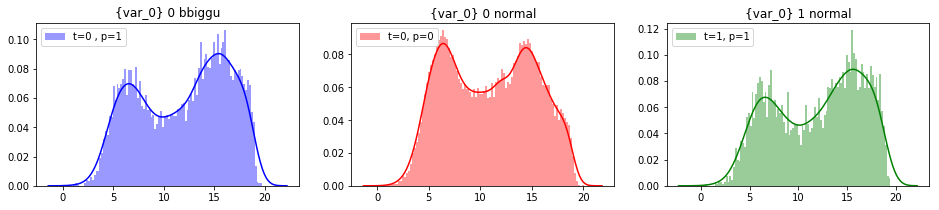

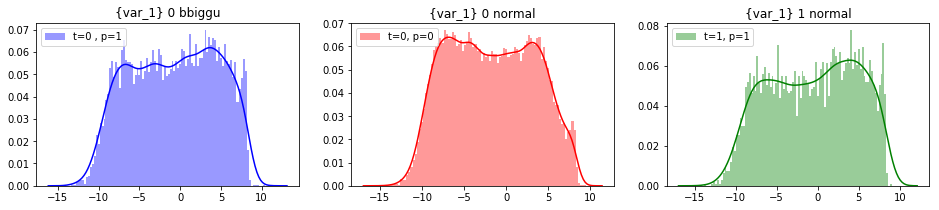

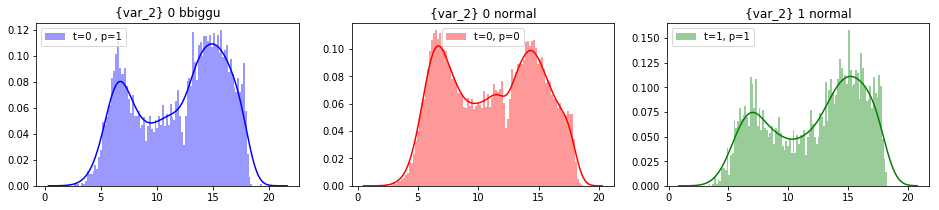

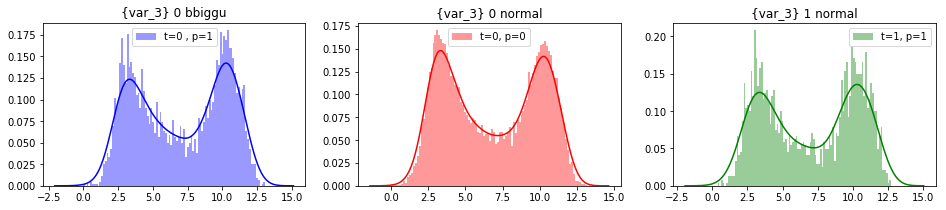

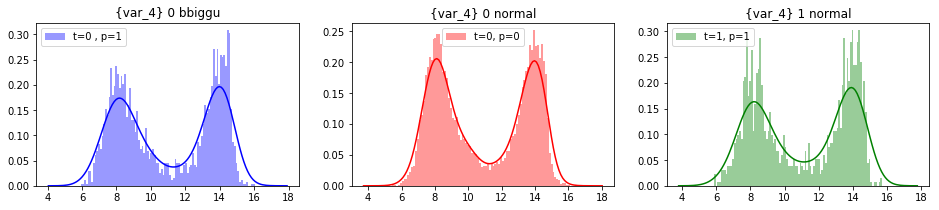

...

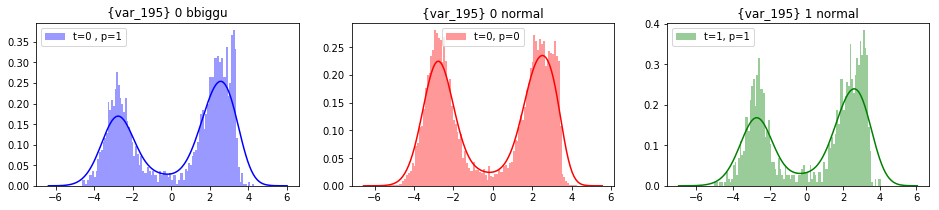

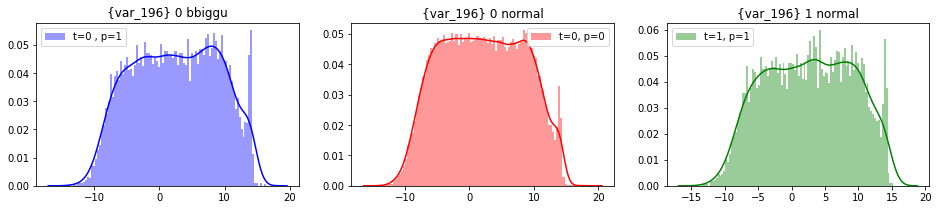

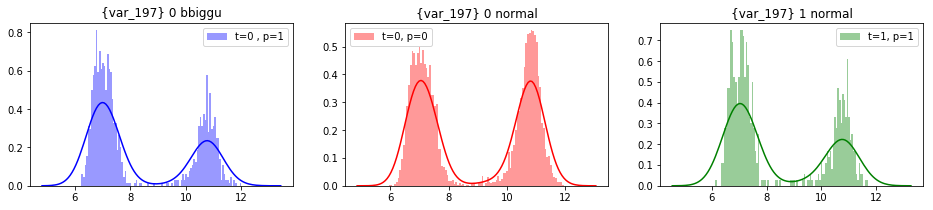

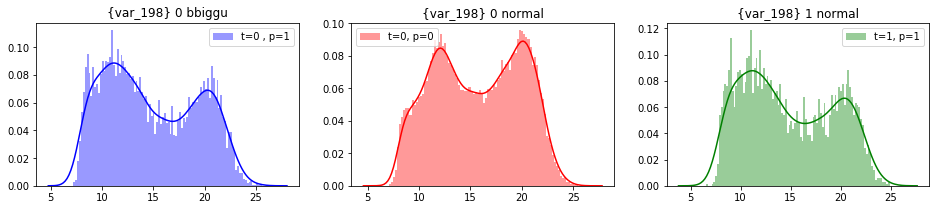

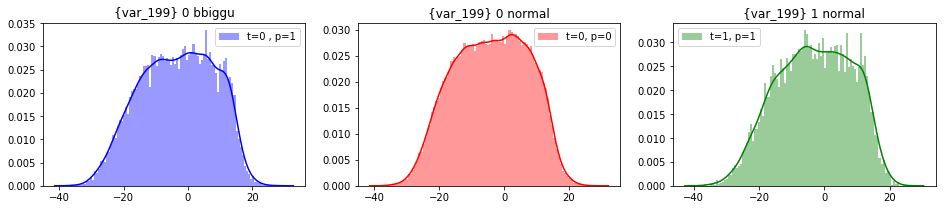

In [52]:
for i, col in enumerate(col_list):
    
    plt.figure(figsize=(16, 3))

    for j in range(1, 4):

        plt.subplot(1, 3, j)

        # 0 삐꾸
        if j % 3 == 1:
            t = list(set(bbiggu_0[col].unique()).intersection(one_dict[col]['target_0']))
            sns.distplot(t, label='t=0 , p=1', color='b', bins=100)
            plt.title('{'+ col + '} 0 bbiggu')
        
        # 0 정상
        elif j % 3 == 2:
            t = list(set(normal_0[col].unique()).intersection(one_dict[col]['target_0']))
            sns.distplot(t, label='t=0, p=0', color='r', bins=100)
            plt.title('{'+ col + '} 0 normal')

        # 1 정상
        else:     
            t = list(set(normal_1[col].unique()).intersection(one_dict[col]['target_1']))
            sns.distplot(t, label='t=1, p=1', color='g', bins=100)
            plt.title('{'+ col + '} 1 normal')

        plt.legend()
            
    plt.show()

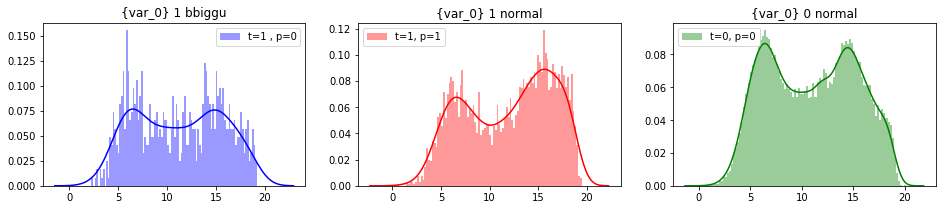

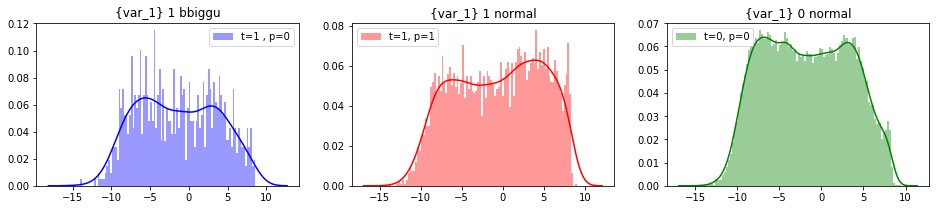

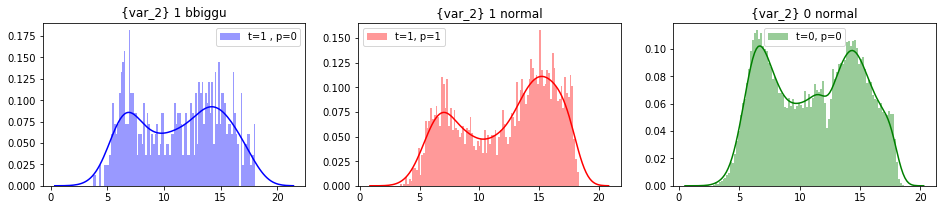

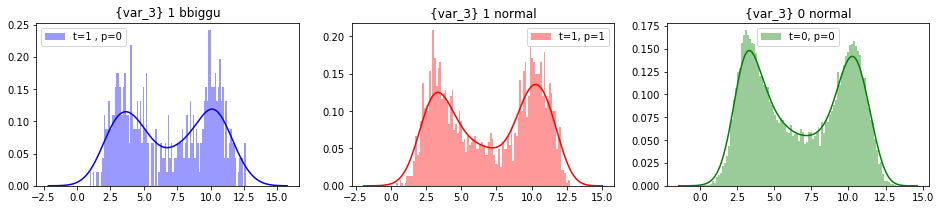

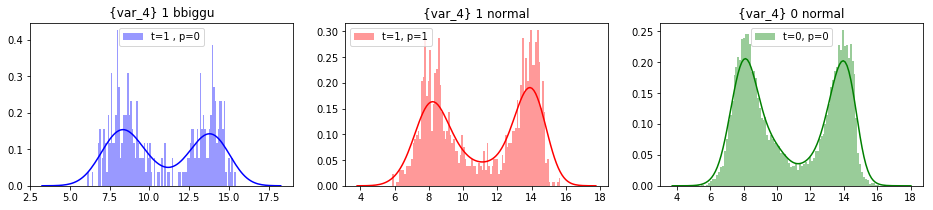

...

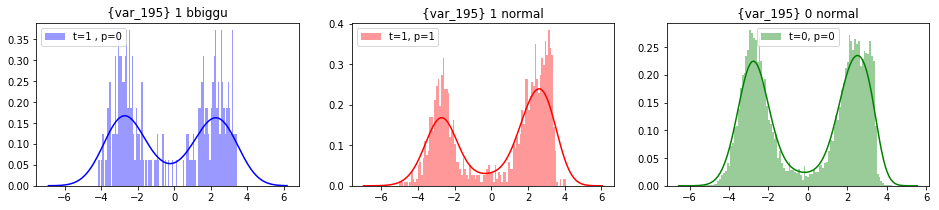

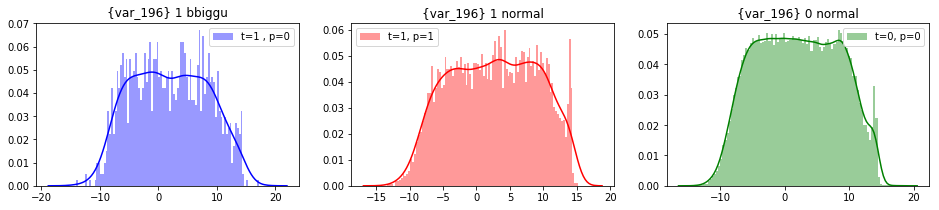

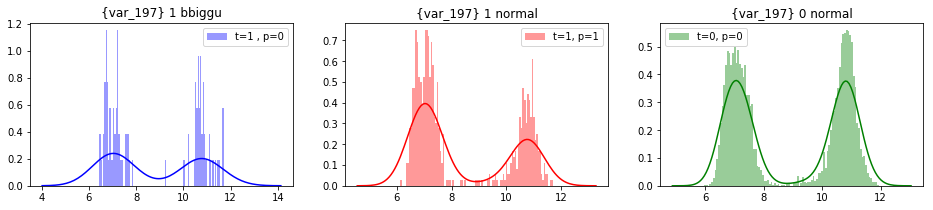

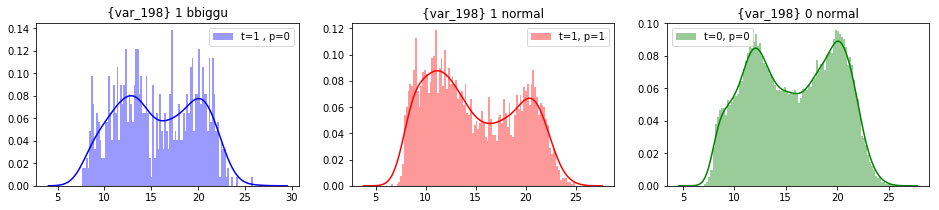

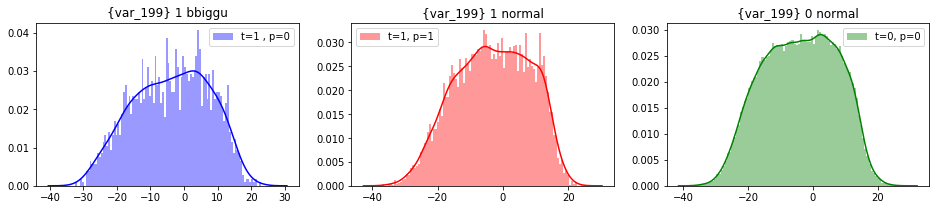

In [53]:
for i, col in enumerate(col_list):
    
    plt.figure(figsize=(16, 3))

    for j in range(1, 4):

        plt.subplot(1, 3, j)

        # 1 삐꾸
        if j % 3 == 1:
            t = list(set(bbiggu_1[col].unique()).intersection(one_dict[col]['target_1']))
            sns.distplot(t, label='t=1 , p=0', color='b', bins=100)
            plt.title('{'+ col + '} 1 bbiggu')
        
        # 1 정상
        elif j % 3 == 2:
            t = list(set(normal_1[col].unique()).intersection(one_dict[col]['target_1']))
            sns.distplot(t, label='t=1, p=1', color='r', bins=100)
            plt.title('{'+ col + '} 1 normal')

        # 0 정상
        else:     
            t = list(set(normal_0[col].unique()).intersection(one_dict[col]['target_0']))
            sns.distplot(t, label='t=0, p=0', color='g', bins=100)
            plt.title('{'+ col + '} 0 normal')

        plt.legend()
            
    plt.show()

# 여러 개(value_counts != 1)

# Unique 변수끼리 scatter plot

In [96]:
unique_df = train[['ID_code']]
con_df = train[['ID_code']]

In [97]:
for col in tqdm(col_list):
    unique_df[col] = train[col].map(((train[col].value_counts() == 1) * 1).to_dict())
    con_df[col] = train[col].map((~(train[col].value_counts() == 1) * 1).to_dict())

In [169]:
unique_train = train[['ID_code', 'target']]
con_train = train[['ID_code', 'target']]

for col in tqdm(col_list):
    unique_train[col] = train[col] * unique_df[col]
    con_train[col] = train[col] * con_df[col]

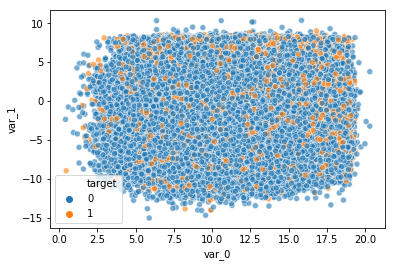

In [171]:
sns.scatterplot('var_0', 'var_1', data=train, hue='target', alpha=0.6)

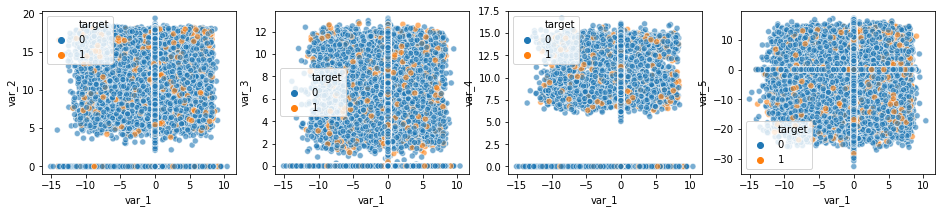

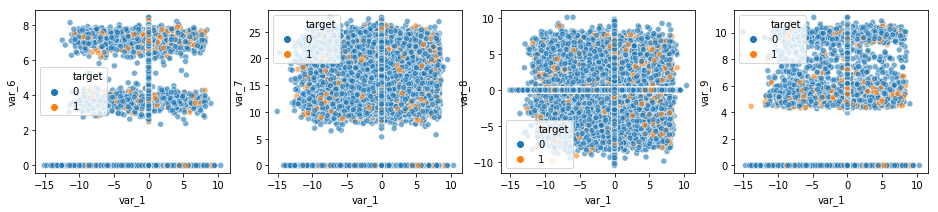

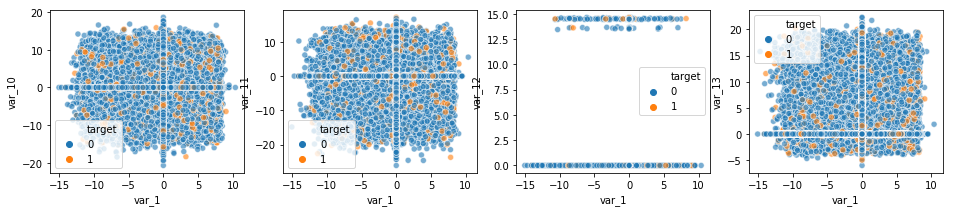

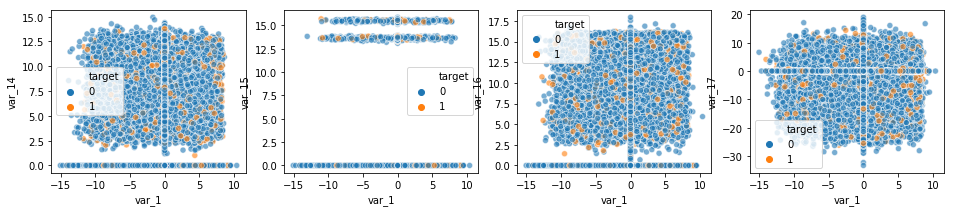

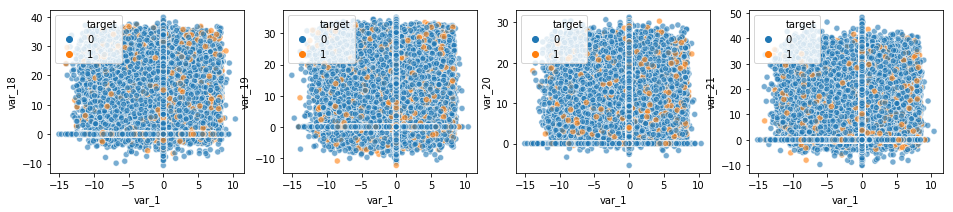

KeyboardInterrupt: 

In [172]:
num = 1

col_list2 = list(range(num+1, 200))

i = 0

while i < 200:
    i = i + 4
    plt.figure(figsize=(16, 3))

    for j, col in enumerate(col_list2[i-4: i]):
        j = j + 1
        
        plt.subplot(1, 4, j)
        
        sns.scatterplot(x='var_'+str(num), y='var_'+str(col), data=unique_train, hue='target', alpha=0.6)
    
    plt.show()
        
        
    

# 피처

In [39]:
unique_df = data[['ID_code']]
con_df = data[['ID_code']]

In [40]:
for col in tqdm(col_list):
    unique_df[col] = data[col].map(((data[col].value_counts() == 1) * 1).to_dict())
    con_df[col] = data[col].map((~(data[col].value_counts() == 1) * 1).to_dict())

In [41]:
for col in tqdm(col_list):
    data[col + '_unique'] = np.around(data[col] * unique_df[col], 4)
    data[col + '_con'] = np.around(data[col] * con_df[col], 4)

In [42]:
for col in tqdm(col_list):
    data.loc[data[col + '_unique']==0, col + '_unique'] = np.nan
    data.loc[data[col + '_con']==0, col + '_con'] = np.nan

In [43]:
for col in tqdm(col_list):
    data[col + '_con_multi_counts'] = data[col + '_con'] * data[col].map(data[col].value_counts().to_dict())

# 삐꾸찾기

In [105]:
# temp = train[train.ID_code.isin(bbiggu_1_id_code)]
temp = data[data.ID_code.isin(normal_0_id_code)][:16603]
# temp = temp.append(train[train.ID_code.isin(normal_0_id_code)])
temp = temp.append(data[data.ID_code.isin(normal_1_id_code)])
temp.shape

(33206, 802)

In [106]:
train = temp

In [107]:
target = train['target']

In [1]:
param = {
    'bagging_freq': 5,
    'bagging_fraction': 0.335,
    'boost_from_average': False,
    'boost': 'gbdt',
    'feature_fraction_seed': 47,
    'feature_fraction': 0.041,
    'learning_rate': 0.01,
    'max_depth': -1,
    'metric':'auc',
    'min_data_in_leaf': 80,
    'min_sum_hessian_in_leaf': 10.0,
    'num_leaves': 2,
    'num_threads': 8,
    'tree_learner': 'serial',
    'objective': 'binary', 
    'verbosity': -1,
    'num_threads': 8
}

* 0.92288
* 0.92308

In [110]:
folds = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

oof_lgb = np.zeros(len(train))
feature_importance = pd.DataFrame()

train_columns = [c for c in train.columns if c not in ['ID_code', 'target']]

for fold_, (trn_idx, val_idx) in enumerate(folds.split(train, target.values)):    
    print("fold n°{}".format(fold_))
    trn_data = lgb.Dataset(train.iloc[trn_idx][train_columns], label=target.iloc[trn_idx])
    val_data = lgb.Dataset(train.iloc[val_idx][train_columns], label=target.iloc[val_idx])

    num_round = 10000
    clf = lgb.train(param, trn_data, num_round, valid_sets = [trn_data, val_data], verbose_eval=200, early_stopping_rounds = 200)
    oof_lgb[val_idx] = clf.predict(train.iloc[val_idx][train_columns], num_iteration=clf.best_iteration)

    print("CV score: {:<8.5f}".format(roc_auc_score(target.values[val_idx], oof_lgb[val_idx])))
    
    break
# print("CV score: {:<8.5f}".format(roc_auc_score(target.values, oof_lgb)))

fold n°0
Training until validation scores don't improve for 200 rounds.
[200]	training's auc: 0.859269	valid_1's auc: 0.85603
[400]	training's auc: 0.876788	valid_1's auc: 0.873823
[600]	training's auc: 0.88636	valid_1's auc: 0.881972
[800]	training's auc: 0.895844	valid_1's auc: 0.891754
[1000]	training's auc: 0.904627	valid_1's auc: 0.90111
[1200]	training's auc: 0.912801	valid_1's auc: 0.908439
[1400]	training's auc: 0.919214	valid_1's auc: 0.915094
[1600]	training's auc: 0.925424	valid_1's auc: 0.920383
[1800]	training's auc: 0.931183	valid_1's auc: 0.925901
[2000]	training's auc: 0.935513	valid_1's auc: 0.930003
[2200]	training's auc: 0.940471	valid_1's auc: 0.934787
[2400]	training's auc: 0.944502	valid_1's auc: 0.938747
[2600]	training's auc: 0.948168	valid_1's auc: 0.942454
[2800]	training's auc: 0.95133	valid_1's auc: 0.945498
[3000]	training's auc: 0.954017	valid_1's auc: 0.948423
[3200]	training's auc: 0.956559	valid_1's auc: 0.951083
[3400]	training's auc: 0.959008	valid_1'

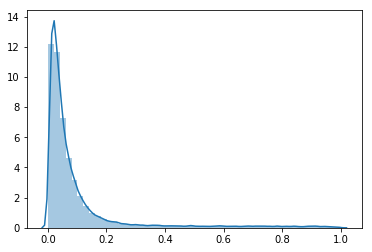

In [53]:
sns.distplot(clf.predict(train.iloc[val_idx][train_columns], num_iteration=clf.best_iteration))

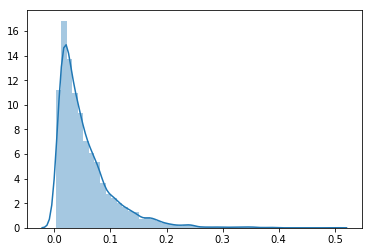

In [55]:
sns.distplot(clf.predict(data[data.ID_code.isin(normal_0_id_code)][-3495:][train_columns], num_iteration=clf.best_iteration))

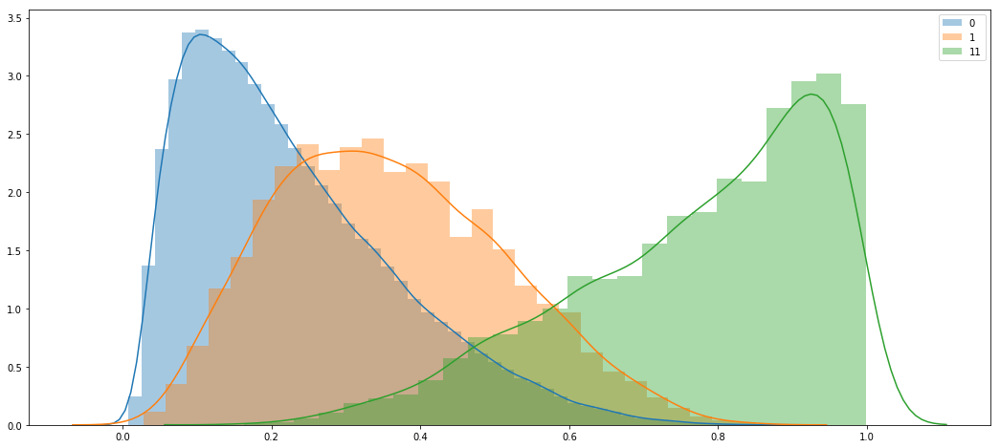

In [156]:
iteration = 10000
plt.figure(figsize=(18,8))
sns.distplot(clf.predict(data[data.ID_code.isin(normal_0_id_code)][-150000:][train_columns], num_iteration=iteration), label='0')
sns.distplot(clf.predict(data[data.ID_code.isin(bbiggu_1_id_code)][train_columns], num_iteration=iteration), label='1')
sns.distplot(clf.predict(train.iloc[val_idx][train.iloc[val_idx].target == 1][-3495:][train_columns], num_iteration=iteration), label='11')
plt.legend()

In [166]:
t = data[data.ID_code.isin(normal_0_id_code)][-130000:].append(data[data.ID_code.isin(bbiggu_1_id_code)]).ID_code

In [167]:
tt = oof[oof.ID_code.isin(t)]

In [168]:
tt['bbiggu'] = 0

In [169]:
tt.loc[tt.ID_code.isin(normal_0_id_code), 'bbiggu'] = clf.predict(data[data.ID_code.isin(normal_0_id_code)][-130000:][train_columns], num_iteration=iteration)

In [170]:
tt.loc[tt.ID_code.isin(bbiggu_1_id_code), 'bbiggu'] = clf.predict(data[data.ID_code.isin(bbiggu_1_id_code)][train_columns], num_iteration=iteration)

In [162]:
tt

,ID_code,target,pred,bbiggu
142,train_142,1.0,0.030521,0.286311
207,train_207,1.0,0.050041,0.545625
301,train_301,1.0,0.068977,0.429492
348,train_348,1.0,0.058803,0.489653
391,train_391,1.0,0.037248,0.341075
410,train_410,1.0,0.049215,0.276969
454,train_454,1.0,0.051215,0.630072
475,train_475,1.0,0.076900,0.632982
507,train_507,1.0,0.097062,0.498119
514,train_514,1.0,0.005936,0.131665


In [171]:
roc_auc_score(tt.target, tt.pred), roc_auc_score(tt.target, tt.pred * tt.bbiggu)

(0.7708272279080004, 0.7743499768900627)

In [130]:
clf.predict(data[data.ID_code.isin(normal_0_id_code)][-3495:][train_columns], num_iteration=iteration)

array([0.04160304, 0.02165584, 0.29464032, ..., 0.17911162, 0.41898474,
       0.24683285])

In [127]:
roc_auc_score(oof[oof.ID_code.isin(t)].target, oof[oof.ID_code.isin(t)].pred)

0.7685773054087077

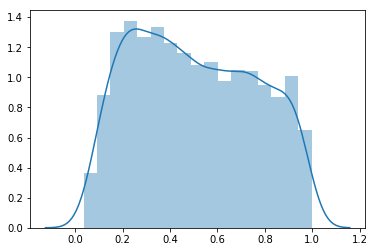

In [63]:
sns.distplot(clf.predict(train.iloc[val_idx][train.iloc[val_idx].target == 1][train_columns], num_iteration=clf.best_iteration))

In [ ]:
train = 